In [1]:
pip install opencv-python


Note: you may need to restart the kernel to use updated packages.


In [9]:
pip install tensorflow


Note: you may need to restart the kernel to use updated packages.


In [13]:
pip install tqdm


     ---------------------------------------- 0.0/57.6 kB ? eta -:--:--
     ------- -------------------------------- 10.2/57.6 kB ? eta -:--:--
     ------- -------------------------------- 10.2/57.6 kB ? eta -:--:--
     ------------- ------------------------ 20.5/57.6 kB 165.2 kB/s eta 0:00:01
     --------------------------- ---------- 41.0/57.6 kB 245.8 kB/s eta 0:00:01
     --------------------------------- ---- 51.2/57.6 kB 262.6 kB/s eta 0:00:01
     --------------------------------- ---- 51.2/57.6 kB 262.6 kB/s eta 0:00:01
     --------------------------------- ---- 51.2/57.6 kB 262.6 kB/s eta 0:00:01
     -------------------------------------- 57.6/57.6 kB 151.8 kB/s eta 0:00:00
   ---------------------------------------- 0.0/78.3 kB ? eta -:--:--
   -------------------- ------------------- 41.0/78.3 kB 960.0 kB/s eta 0:00:01
   ------------------------------------ --- 71.7/78.3 kB 975.2 kB/s eta 0:00:01
   ------------------------------------ --- 71.7/78.3 kB 975.2 kB/s eta 

In [14]:
import matplotlib.pyplot as plt
import cv2
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tqdm import tqdm
import random

In [18]:
print(os.listdir("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train"))

['CNV', 'DME', 'DRUSEN', 'NORMAL']


In [19]:
normal_len = len(os.listdir("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/NORMAL"))
drusen_len = len(os.listdir("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/DRUSEN"))
cnv_len = len(os.listdir("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/CNV"))
dme_len = len(os.listdir("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/DME"))

In [20]:
print("length of normal images = ",normal_len)
print("length of images with disease drusen = ",drusen_len)
print("length of images with disease cnv = ",cnv_len)
print("length of images with disease dme = ",dme_len)

length of normal images =  26315
length of images with disease drusen =  8616
length of images with disease cnv =  37205
length of images with disease dme =  11348


In [24]:
#checking shapes of each image according to groups
#NORMAL
files = os.listdir("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/NORMAL/")
size = []
for i in tqdm(range(len(files))):
    img = cv2.imread("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/NORMAL/"+files[i])
    #print("image size = ",img.shape)
    size.append(img.shape)
print("There are different sizes of NORMAL images, they are = ",set(size))

100%|████████████████████████████████████████████████████████████████████████████| 26315/26315 [07:05<00:00, 61.80it/s]

There are different sizes of NORMAL images, they are =  {(496, 512, 3), (496, 1024, 3), (512, 512, 3), (496, 384, 3), (496, 1536, 3), (496, 768, 3)}


In [25]:
#DRUSEN
files = os.listdir("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/DRUSEN/")
size = []
for i in tqdm(range(len(files))):
    img = cv2.imread("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/DRUSEN/"+files[i])
    #print("image size = ",img.shape)
    size.append(img.shape)
print("There are different sizes of DRUSEN images, they are = ",set(size))

100%|██████████████████████████████████████████████████████████████████████████████| 8616/8616 [03:17<00:00, 43.58it/s]

There are different sizes of DRUSEN images, they are =  {(496, 512, 3), (496, 768, 3), (496, 1536, 3), (496, 1024, 3)}


In [26]:
#CNV
files = os.listdir("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/CNV/")
size = []
for i in tqdm(range(len(files))):
    img = cv2.imread("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/CNV/"+files[i])
    #print("image size = ",img.shape)
    size.append(img.shape)
print("There are different sizes of CNV images, they are = ",set(size))

100%|████████████████████████████████████████████████████████████████████████████| 37205/37205 [14:10<00:00, 43.72it/s]

There are different sizes of CNV images, they are =  {(496, 512, 3), (496, 1024, 3), (496, 384, 3), (496, 1536, 3), (496, 768, 3)}


In [28]:
#DME
files = os.listdir("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/DME/")
size = []
for i in tqdm(range(len(files))):
    img = cv2.imread("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/DME/"+files[i])
    #print("image size = ",img.shape)
    size.append(img.shape)
print("There are different sizes of DME images, they are = ",set(size))

100%|████████████████████████████████████████████████████████████████████████████| 11348/11348 [04:27<00:00, 42.43it/s]

There are different sizes of DME images, they are =  {(496, 512, 3), (496, 1024, 3), (512, 512, 3), (496, 1536, 3), (496, 768, 3)}


Five images from class - NORMAL


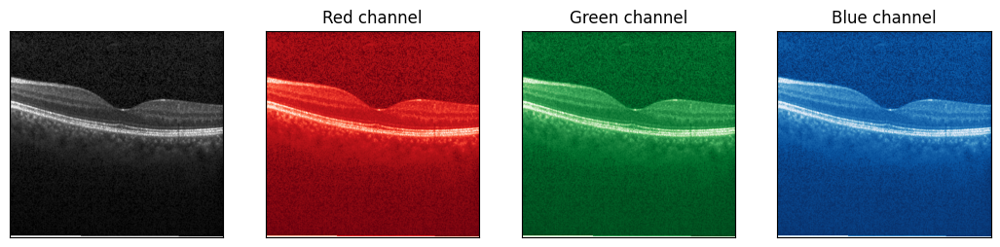

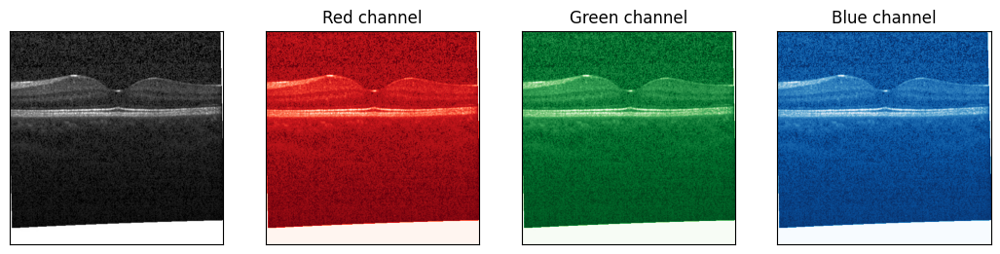

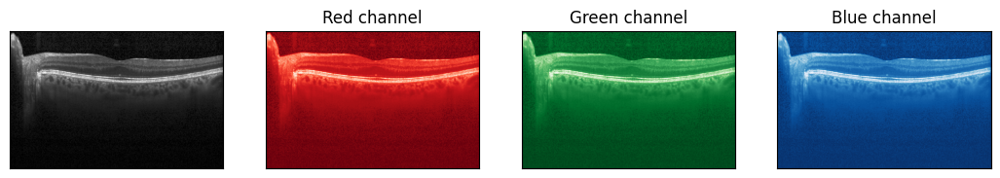

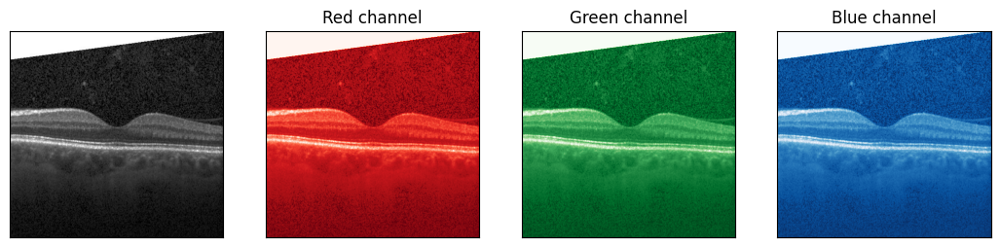

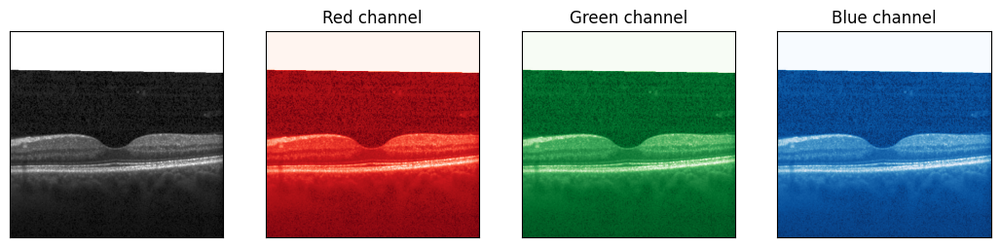

In [30]:
#SHOW IMAGES RANDOMLY FROM ALL CATEGORIES ON IFFERENT RGB CHANNELS
#NORMAL

files = os.listdir("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/NORMAL/")
titles = ['', 'Red channel', 'Green channel', 'Blue channel']
cmaps = [None, plt.cm.Reds_r, plt.cm.Greens_r, plt.cm.Blues_r]

print('Five images from class - NORMAL')
for i in range(5):
    image = cv2.imread("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/NORMAL/"+random.choice(files))
    
    fig, axes = plt.subplots(1, 4, figsize=(13,3))
    objs = zip(axes, (image, *image.transpose(2,0,1)), titles, cmaps)
    
    for ax, channel, title, cmap in objs:
        ax.imshow(channel, cmap=cmap)
        ax.set_title(title)
        ax.set_xticks(())
        ax.set_yticks(())

Five images from class - DRUSEN


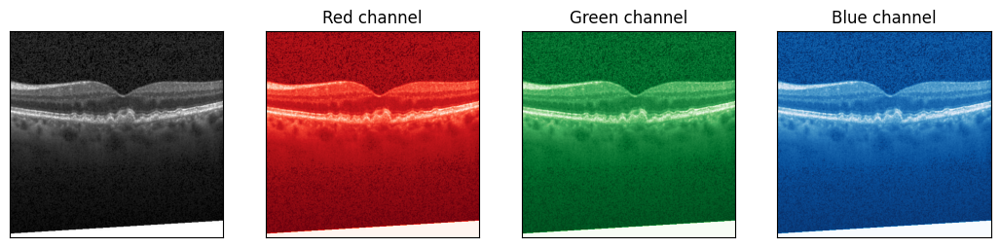

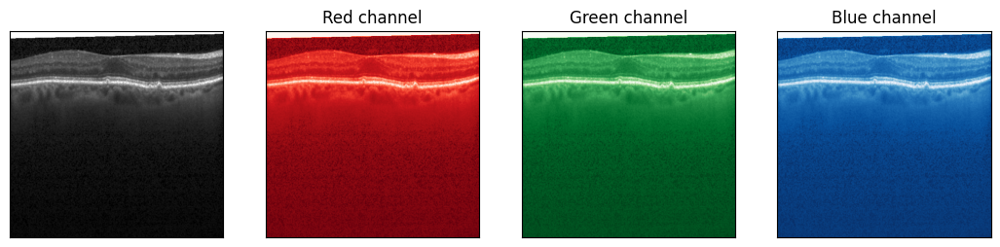

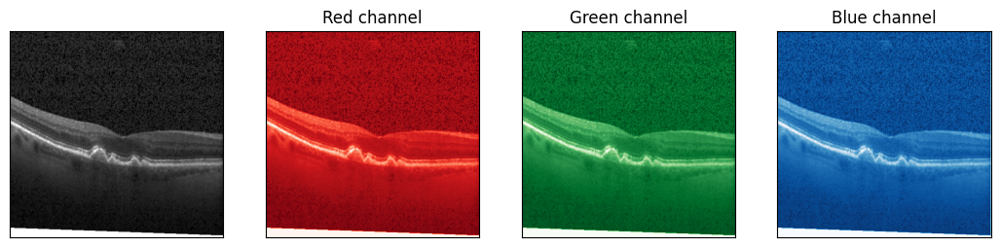

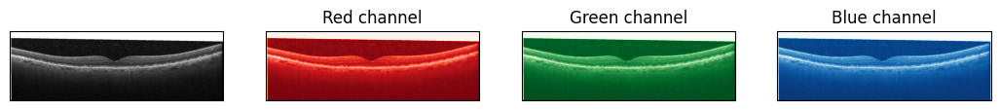

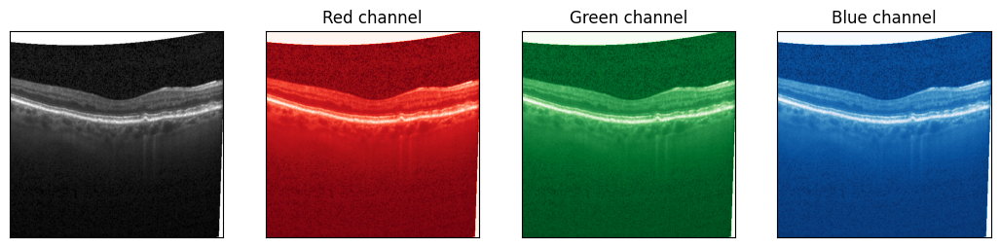

In [32]:
#DRUSEN
files = os.listdir("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/DRUSEN/")
titles = ['', 'Red channel', 'Green channel', 'Blue channel']
cmaps = [None, plt.cm.Reds_r, plt.cm.Greens_r, plt.cm.Blues_r]

print('Five images from class - DRUSEN')
for i in range(5):
    image = cv2.imread("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/DRUSEN/"+random.choice(files))
    
    fig, axes = plt.subplots(1, 4, figsize=(13,3))
    objs = zip(axes, (image, *image.transpose(2,0,1)), titles, cmaps)
    
    for ax, channel, title, cmap in objs:
        ax.imshow(channel, cmap=cmap)
        ax.set_title(title)
        ax.set_xticks(())
        ax.set_yticks(())

Five images from class - CNV


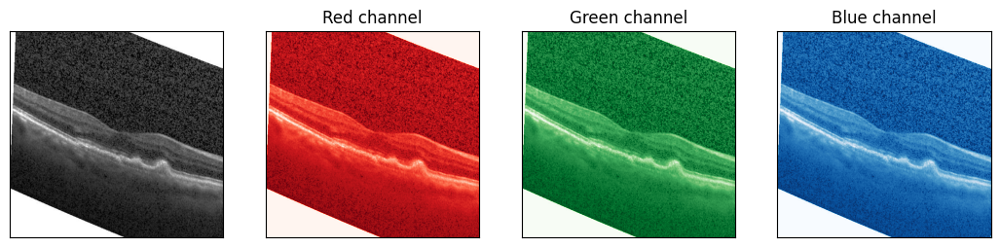

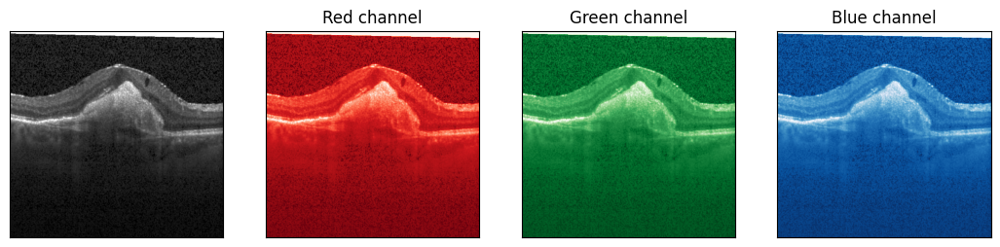

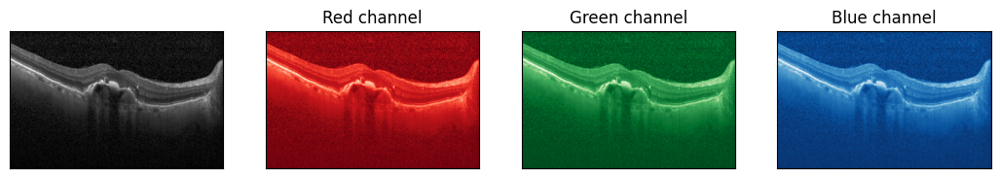

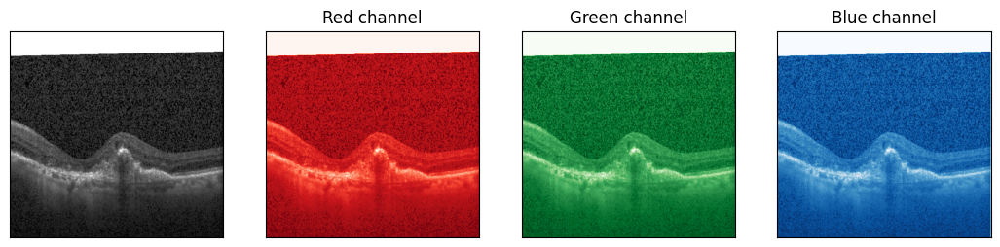

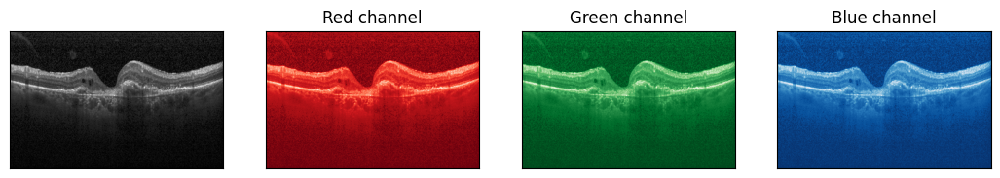

In [33]:
#CNV
files = os.listdir("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/CNV/")
titles = ['', 'Red channel', 'Green channel', 'Blue channel']
cmaps = [None, plt.cm.Reds_r, plt.cm.Greens_r, plt.cm.Blues_r]

print('Five images from class - CNV')
for i in range(5):
    image = cv2.imread("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/CNV/"+random.choice(files))
    
    fig, axes = plt.subplots(1, 4, figsize=(13,3))
    objs = zip(axes, (image, *image.transpose(2,0,1)), titles, cmaps)
    
    for ax, channel, title, cmap in objs:
        ax.imshow(channel, cmap=cmap)
        ax.set_title(title)
        ax.set_xticks(())
        ax.set_yticks(())

Five images from class - DME


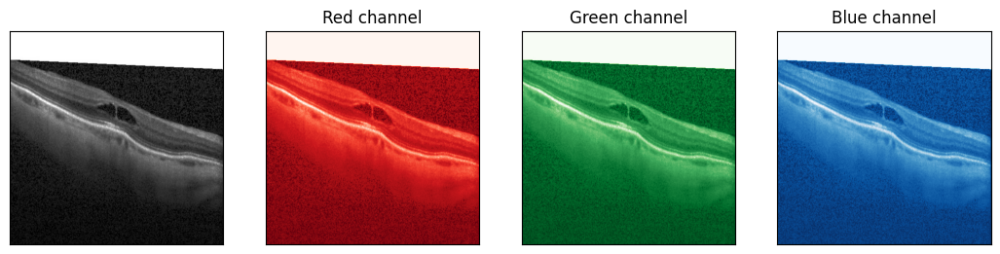

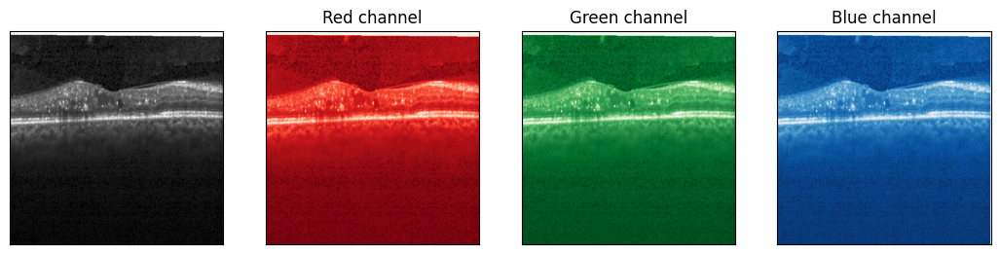

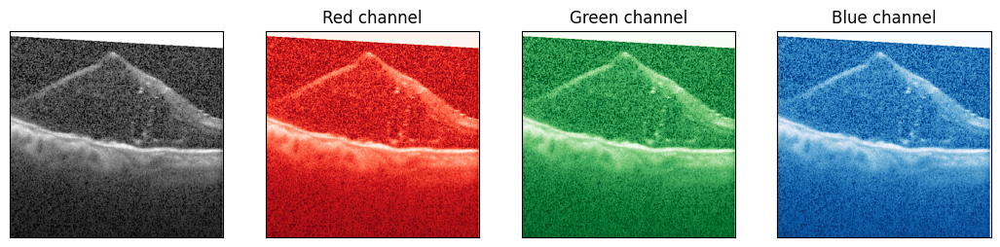

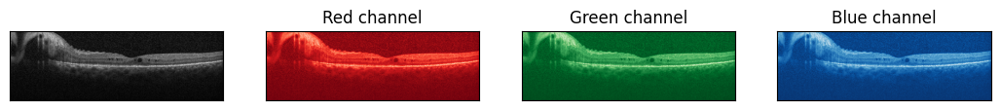

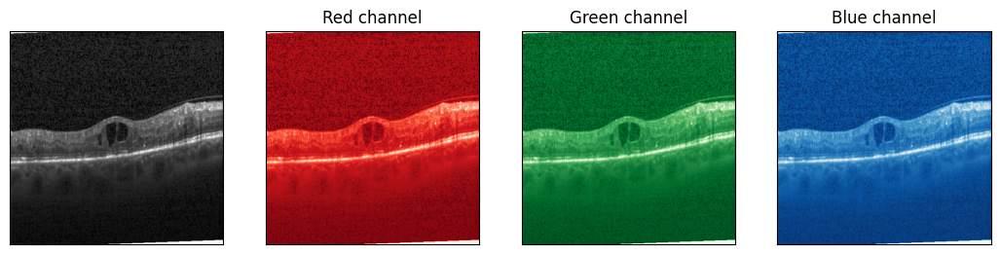

In [34]:
#DME
files = os.listdir("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/DME/")
titles = ['', 'Red channel', 'Green channel', 'Blue channel']
cmaps = [None, plt.cm.Reds_r, plt.cm.Greens_r, plt.cm.Blues_r]

print('Five images from class - DME')
for i in range(5):
    image = cv2.imread("C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/DME/"+random.choice(files))
    
    fig, axes = plt.subplots(1, 4, figsize=(13,3))
    objs = zip(axes, (image, *image.transpose(2,0,1)), titles, cmaps)
    
    for ax, channel, title, cmap in objs:
        ax.imshow(channel, cmap=cmap)
        ax.set_title(title)
        ax.set_xticks(())
        ax.set_yticks(())

In [36]:
#IMAGE RESIZING/SHAPING USING IMAGE DATA GENARATOR
labels = os.listdir('C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train/')
IMG_SIZE = 224
batch_size = 16
train_data_dir = 'C:/Users/siva/Documents/OCT/OCT2017/OCT2017/train'
train_datagen = ImageDataGenerator(samplewise_center=True, 
                              samplewise_std_normalization=True)
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(IMG_SIZE , IMG_SIZE),
    batch_size=16,
    class_mode='categorical')


Found 83484 images belonging to 4 classes.


In [37]:
t_x, t_y = next(train_generator)
fig, m_axs = plt.subplots(4, 4, figsize = (256, 256))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0], cmap = 'bone')
    c_ax.set_title(', '.join([n_class for n_class, n_score in zip(labels, c_y) 
                             if n_score>0.5]))
    c_ax.axis('off')